# localize nodules on 70 dicoms
- conda activate misc1 (pydicom)   
- 'Case_030' different format (11, 512, 512)  

In [1]:
import os
import numpy as np
import pandas as pd
import pydicom
import copy
import cv2
from itertools import chain
from collections import defaultdict
from matplotlib.patches import Rectangle
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
from functools import reduce
from operator import add

### Get the data

In [3]:
path_data = '/data/OMM/Datasets/Lung Nodule Study cases/Lung Nodule Study cases/'

In [4]:
cases = [i for i in os.listdir(path_data) if 'Case' in i]
cases = np.sort(cases)

In [5]:
'''
Create a dictionary with all the scans with the form:
d['Case_001']['chest_scans', 'lung_scans'], e.g.
d['Case_001'][(5, 512, 512) ,(5, 708, 708, 3)]
'''
d = {}
for idx, i in enumerate(cases):
    #print(idx, i)
    # get the subfolders names
    chest = [k for k in os.listdir(path_data + i + '/study/') if 'CHEST' in k or 'Chest' or 'AXIAL' in k]
    lung = [k for k in os.listdir(path_data + i + '/study/') if 'Lung' in k]
    
    # read the chest and lung pydicoms
    # Chest
    path_chest = path_data + i + '/study/' + chest[0]
    dicoms = os.listdir(path_chest)
    dicoms = np.sort(dicoms)
    chest_scans = []
    for single_dicom in dicoms:
        path_scan = path_data + i + '/study/' + chest[0] + '/' + single_dicom
        ds = pydicom.dcmread(path_scan)
        chest_scans.append(ds.pixel_array)
    # Lungs
    path_lung = path_data + i + '/study/' + lung[0]
    dicoms = os.listdir(path_lung)
    dicoms = np.sort(dicoms)
    lung_scans = []
    for single_dicom in dicoms:
        path_scan = path_data + i + '/study/' + lung[0] + '/' + single_dicom
        ds = pydicom.dcmread(path_scan)
        lung_scans.append(ds.pixel_array)
    d[i] = {}
    d[i]['chest_scans'] = chest_scans
    d[i]['lung_scans'] = lung_scans

### In some cases instead of two modalities the scans are identical

In [6]:
shape_chest_scans = []
shape_lung_scans = []
case_names = []
they_are_same = []
for idx, i in enumerate(list(d.keys())):
    shape_chest_scans.append(np.shape(d[i]['chest_scans']))
    shape_lung_scans.append(np.shape(d[i]['lung_scans']))
    a = np.asarray(d[i]['chest_scans'])
    b = np.asarray(d[i]['lung_scans'])
    they_are_same.append(np.array_equal(a,b))
    case_names.append(i)

In [7]:
df = pd.DataFrame({
    'shape_chest_scans': shape_chest_scans,
    'shape_lung_scans': shape_lung_scans,
    'case_names': case_names,
    'they_are_same':they_are_same})
df.head()

,shape_chest_scans,shape_lung_scans,case_names,they_are_same
0,"(5, 512, 512)","(5, 708, 708, 3)",Case_001,False
1,"(11, 512, 512)","(12, 708, 708, 3)",Case_002,False
2,"(9, 512, 512)","(13, 708, 708, 3)",Case_003,False
3,"(13, 708, 708, 3)","(13, 708, 708, 3)",Case_004,True
4,"(8, 512, 512)","(12, 708, 708, 3)",Case_005,False


### Check other inconsistencies   
- how many scans we have of each modality   
- how many slices we can use

In [8]:
# Number of scans with one channel
chest_scans_last_dim = [i[-1]!=3 for i in df.shape_chest_scans]
total_chest_scans = np.sum(chest_scans_last_dim)
print(f'scans with one channel = {total_chest_scans}')

scans with one channel = 48


In [9]:
# Number of slices per scan (one channel)
chest_scans_n_slices = []
for i in np.where(chest_scans_last_dim)[0]:
    chest_scans_n_slices.append(list(df.shape_chest_scans[i])[0])
##
for idx, i in enumerate(np.arange(5,8)):
    nSlices = [j < i for j in chest_scans_n_slices]
    nSlices = np.sum(nSlices)
    print(f'if we use {i} slices per scan we have: {total_chest_scans-nSlices} (one channel)')

if we use 5 slices per scan we have: 48 (one channel)
if we use 6 slices per scan we have: 44 (one channel)
if we use 7 slices per scan we have: 41 (one channel)


In [10]:
lung_scans_last_dim = [i[-1]==3 for i in df.shape_lung_scans]
total_shape_lung_scans = np.sum(lung_scans_last_dim)
print(f'RGB scans with imprinted arrow = {total_shape_lung_scans}')

RGB scans with imprinted arrow = 69


In [11]:
# Number of slices per scan (three channels)
lung_scans_n_slices = []
for i in np.where(lung_scans_last_dim)[0]:
    lung_scans_n_slices.append(list(df.shape_lung_scans[i])[0])
##
for idx, i in enumerate(np.arange(5,8)):
    nSlices = [j <= i for j in lung_scans_n_slices]
    nSlices = np.sum(nSlices)
    print(f'if we use {i} slices per scan we have: {total_shape_lung_scans-nSlices} (RGB)')

if we use 5 slices per scan we have: 68 (RGB)
if we use 6 slices per scan we have: 67 (RGB)
if we use 7 slices per scan we have: 64 (RGB)


In [ ]:
# # Check scans
# for idx, i in enumerate(list(d.keys())):
#     fig, ax = plt.subplots(1,2 ,figsize = (16,10))
#     fig.subplots_adjust(0,0,1,1)
#     ax[1].set_title(idx)
#     ax[0].imshow(d[i]['chest_scans'][0])
#     ax[1].imshow(d[i]['lung_scans'][0])
#     #fig.savefig(f'figures/chest_lung/case {idx}.jpg', frameon=False)

---

### We locate the arrows looking to red pixels based on RGB

[255  42  54]


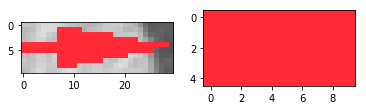

In [12]:
i = d['Case_005']['lung_scans'][4]
template = i[402:412,98:128,:]
template2 = i[404:409,106:116,:]
fig, ax = plt.subplots(1,2)
ax[0].imshow(template)
ax[1].imshow(template2)
print(template2[0][0])

In [13]:
i = d['Case_005']['lung_scans'][4]
np.sum((i==[255, 42, 54]).all(axis =2)*1)

148

#### Functions used

In [14]:
def locate_red_arrow(img, crop=True):
    '''Find the arrow based on red RGB colors. 
    We first crop the bottom because there is a red sign there.
    Return the coordinates of the red pixels that should correspond to the arrow'''
    if crop==False:
        crop=-1
    else:
        crop=640
    x1, y1 = np.where(img[:crop,:,0]>=215) #R
    x2, y2 = np.where(img[:crop,:,1]<=72) #G
    x3, y3 = np.where(img[:crop,:,2]<=84) #B
    c1 = [(x,y) for x,y in zip(x1, y1)]
    c2 = [(x,y) for x,y in zip(x2, y2)]
    c3 = [(x,y) for x,y in zip(x3, y3)]
    c = list(set(c1).intersection(c2).intersection(c3))
    c = np.asarray(c)
    return c

In [15]:
def right_left(pixels, scan_zoom):
    ''' returns whether the arrow points to the left or the right (y_nodule)'''
    x_median = np.median(pixels[:,0])
    x_half = np.shape(scan_zoom)[0]//2
    x_nodule = x_median-x_half 
    
    y_median = np.median(pixels[:,1])
    y_half = np.shape(scan_zoom)[1]//2
    y_nodule = y_median-y_half 
    return x_nodule, y_nodule

### Find nodules in all patients based on arrow

In [16]:
all_arrows = []
all_scans_with_arrows = []
all_coords = []
all_nodules = []
all_coords_nodules = []
slice_number = []
for idx_d, patient in enumerate(d):
    
    arrow_pixels = []
    if patient == 'Case_030': # skip case 30. It does not have the same format
        all_scans_with_arrows.append(np.zeros_like(scan_with_arrow))
        all_coords.append([0,2,0,2])
        all_coords_nodules.append([0,2,0,2])
        slice_number.append(0)
        continue 
    for idx, i in enumerate(d[patient]['lung_scans']):
       
        red_pixels = locate_red_arrow(i)
        # threshold = 90 red pixels used to decide if found the arrow
        if len(red_pixels) >= 90:
            arrow_pixels = red_pixels
            scan_with_arrow = i
            x_min = np.min((arrow_pixels)[:,0])
            x_max = np.max((arrow_pixels)[:,0])
            y_min = np.min((arrow_pixels)[:,1])
            y_max = np.max((arrow_pixels)[:,1])

            all_scans_with_arrows.append(scan_with_arrow)
            scan_zoom = scan_with_arrow[x_min:x_max,y_min:y_max]
            all_arrows.append(scan_zoom)
            img_coords = [x_min, x_max, y_min, y_max]
            all_coords.append(img_coords)

            red_pixels3 = locate_red_arrow(scan_zoom, crop=False)
            up_down, left_right = right_left(red_pixels3, scan_zoom)

            ndl_msk_sz = 32
            if left_right > -.1:                
                all_coords_nodules.append([img_coords[1]-int(ndl_msk_sz/2), img_coords[1]+int(ndl_msk_sz/2), img_coords[3]+1, img_coords[3]+ndl_msk_sz+1])
            else:            
                all_coords_nodules.append([img_coords[1]-int(ndl_msk_sz/2), img_coords[1]+int(ndl_msk_sz/2), img_coords[2]-ndl_msk_sz-1, img_coords[2]-1])
            
            n_slices = np.shape(d[patient]['lung_scans'])[0]
            slice_number.append(idx)
            # print(f'patient = {patient}, slice = {idx} from {n_slices}, pixels found = {len(red_pixels)}')

---

## Coordinates without refinement

/home/om18/anaconda3/envs/misc1/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


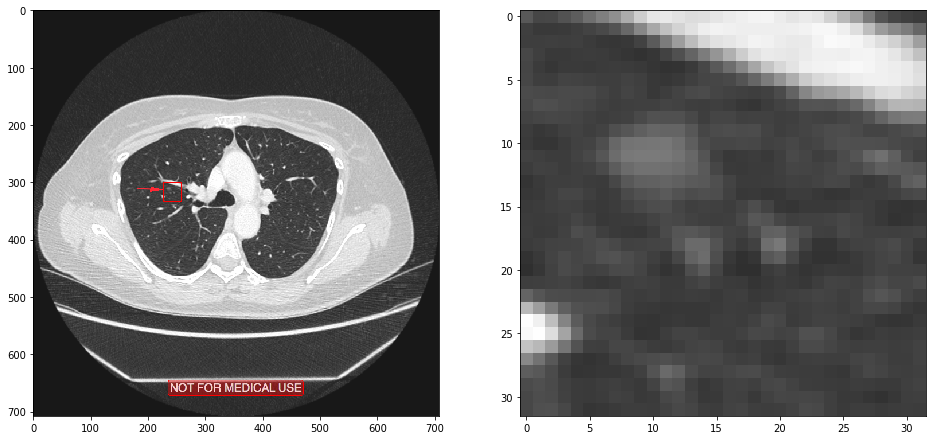

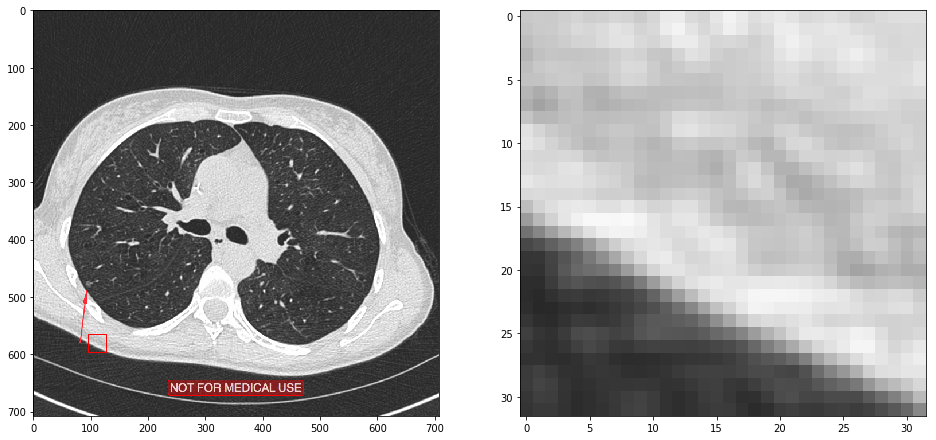

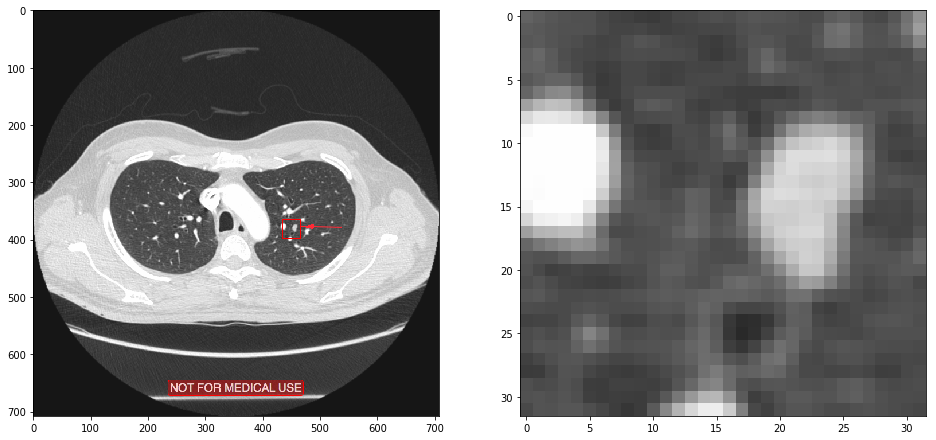

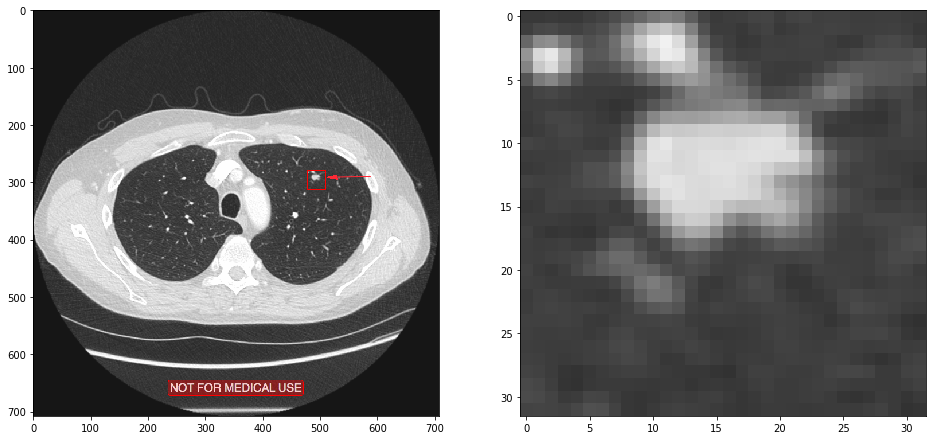

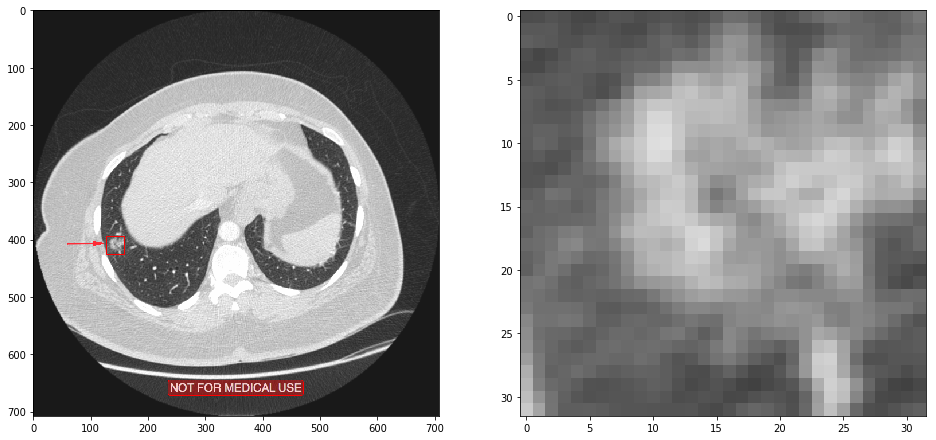

...

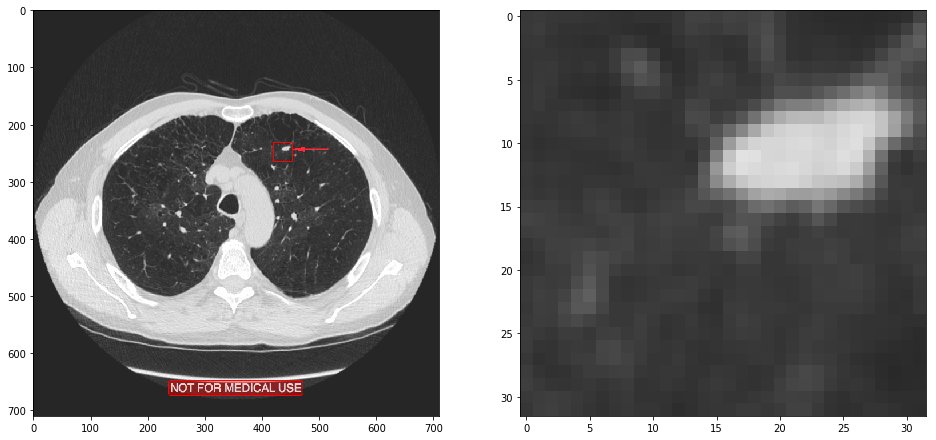

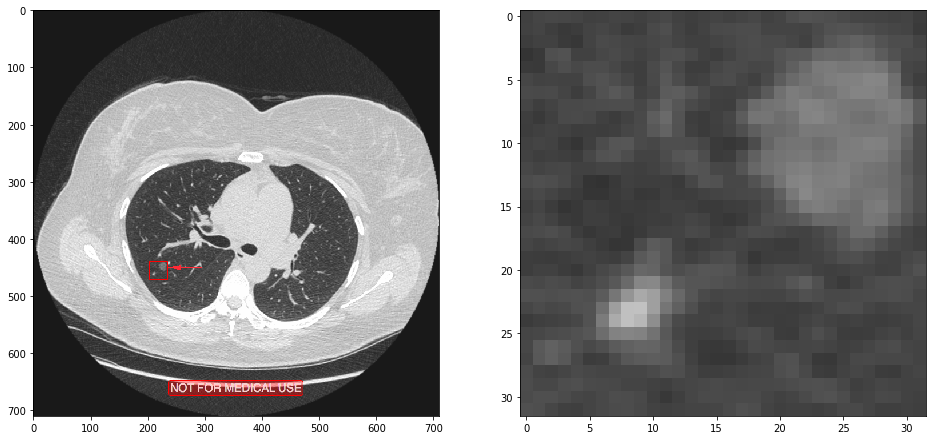

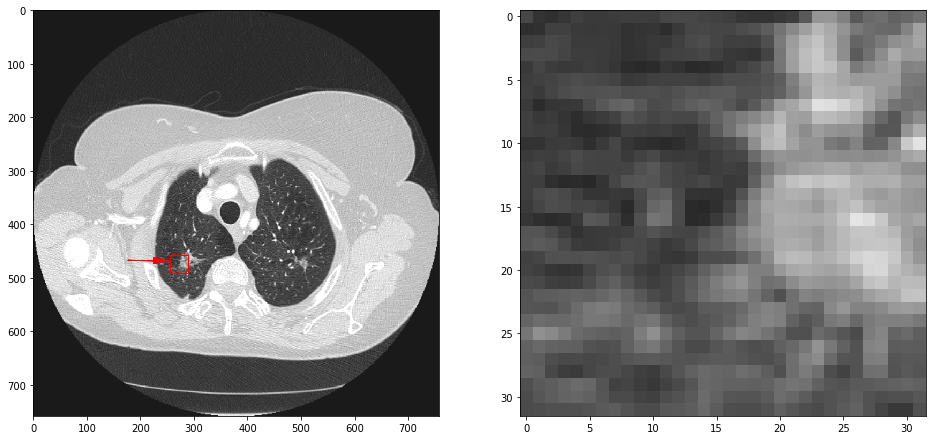

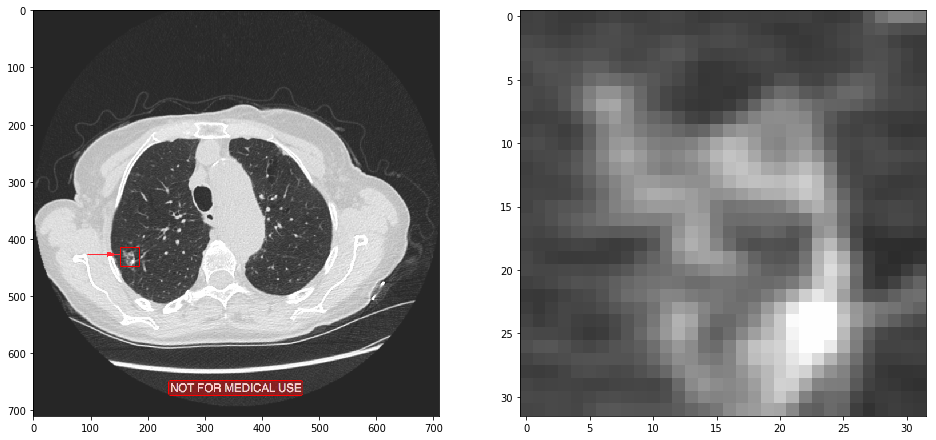

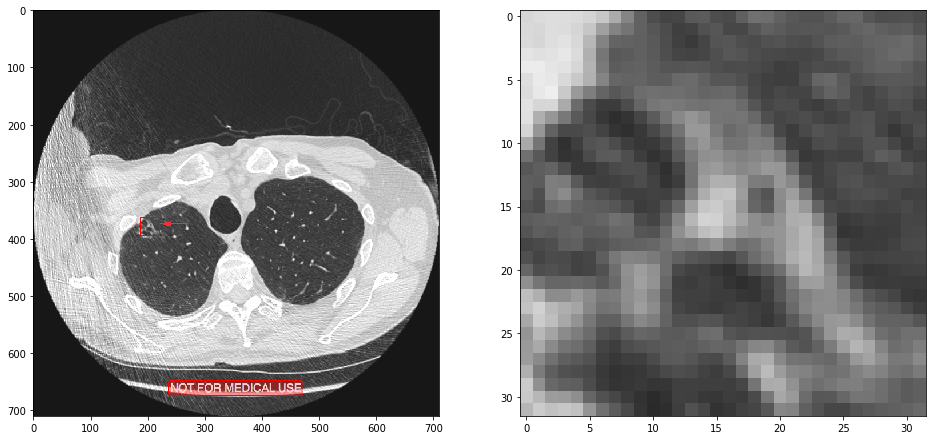

In [17]:
for idx, i in enumerate(all_scans_with_arrows):
    #if idx !=53: continue
    fig, ax = plt.subplots(1,2,figsize=(16,14))
    ax[0].imshow(i)
    x0, x1, y0, y1 = all_coords_nodules[idx]
    rect = Rectangle((y0,x0), x1-x0, y1-y0, linewidth=1,edgecolor='r',facecolor='none')
    ax[0].add_patch(rect)
    ax[1].imshow(i[x0:x1,y0:y1,:])

### Manually refine coordinates

In [18]:
#[left < righ, up < down]
refine = defaultdict(lambda: [0, 0])
refine[0] = [-0,-4]
refine[1] = [-10, -107]
refine[2] = [1, 0]
refine[3] = [-3, -5]
refine[5] = [1, -3]
refine[6] = [1, -5]
refine[8] = [1, -4]
refine[9] = [1, -2]
refine[10] = [1, -3]
refine[13] = [-4, 0]
refine[15] = [-12, -89]
refine[16] = [0, -8]
refine[18] = [0, -6]
refine[19] = [0, -4]
refine[22] = [80, 0]
refine[24] = [0, -4]
refine[25] = [0, -5]
refine[26] = [0, -4]
refine[28] = [0, -2]
refine[30] = [1, -2]
refine[33] = [0, -4]
refine[34] = [-20, -74]
refine[35] = [0, -6]
refine[36] = [0, -4]
refine[37] = [0, -4]
refine[38] = [0, -4]
refine[39] = [1, -4]
refine[42] = [0, -4]
refine[44] = [1, -4]
refine[45] = [0, -8]
refine[46] = [0, 2]
refine[48] = [-2, -2]
refine[49] = [2, -4]
refine[51] = [2, -2]
refine[52] = [0, -4]
refine[50] = [4, -8]
refine[53] = [1, -4]
refine[54] = [0, -2]
refine[56] = [0, 10]
refine[61] = [0, -4]
refine[62] = [14, -4]
refine[63] = [1, -4]
refine[65] = [0, -4]
refine[66] = [1, -4]
refine[67] = [12, -4]
refine[69] = [-8, 4]

coords_refined = []
for idx, i in enumerate(all_scans_with_arrows):
    #if idx<67: continue
    x0, x1, y0, y1 = all_coords_nodules[idx]
    # refine the coordinates
    x0, x1, y0, y1 = x0 + refine[idx][1], x1 + refine[idx][1], y0 + refine[idx][0], y1 + refine[idx][0]
    coords_refined.append([x0, x1, y0, y1])
    #Plot
#     fig, ax = plt.subplots(1,2,figsize=(16,10))
#     fig.subplots_adjust(0,0,1,1)
#     ax[0].imshow(i)
#     rect = Rectangle((y0,x0), x1-x0, y1-y0, linewidth=4,edgecolor='r',facecolor='none')
#     ax[0].add_patch(rect)
#     ax[1].imshow(i[x0:x1,y0:y1,:])
#     ax[1].set_title(idx)
#     #fig.savefig(f'figures/nodules_locations/case {idx}.jpg', frameon=False)

---

### Get the nodules from the middle slice and slices next to it

In [19]:
lung_ndls = []
for idx, i in enumerate(list(d.keys())):
    lung_ndls.append(d[i]['lung_scans'])

In [20]:
ndls_five_scans = []
for idx, i in enumerate(lung_ndls):
    if idx ==29: #skip patient
        ndls_five_scans.append(np.zeros_like(ndl_five_scans))
        continue
    # Find the middle scan and the scans next to it
    middle_scan = int(np.floor(np.shape(i)[0]/2))
    five_scans = i[middle_scan - 2:middle_scan + 3]
    # For each of the five slices get the patch where the nodule is located
    ndl_five_scans = []
    for k in five_scans:
        ndl_five_scans.append(k[coords_refined[idx][0]:coords_refined[idx][1],
                                 coords_refined[idx][2]:coords_refined[idx][3], :])
    ndls_five_scans.append(ndl_five_scans)

In [21]:
np.shape(ndls_five_scans)

(70, 5, 32, 32, 3)

In [22]:
# # Check the nodules
# for idx in np.arange(0,len(ndls_five_scans),5):
#     fig, ax = plt.subplots(1,5,figsize=(14,6))
#     ax[0].imshow(ndls_five_scans[idx][2])
#     ax[1].imshow(ndls_five_scans[idx+1][2])
#     ax[2].imshow(ndls_five_scans[idx+2][2])
#     ax[3].imshow(ndls_five_scans[idx+3][2])
#     ax[4].imshow(ndls_five_scans[idx+4][2])
#     ax[0].set_title(idx),ax[1].set_title(idx+1),ax[2].set_title(idx+2),ax[3].set_title(idx+3)
#     ax[4].set_title(idx+4)   

In [23]:
np.save('nodules_five_scans_69_cases_RGB.npy',ndls_five_scans)

---

### Check the reviewers evaluation

In [24]:
df = pd.read_csv('Nodule Study raw data for KCL.csv')
df.columns = ['NoduleNo', 'GGN', 'PSN', 'Solid', 'initial_mgmt_discharge','initial_mgmt_follow_up', 
             'strategy_discharge', 'strategy_CT', 'strategy_invasive', 'strategy_hybrid', 
             'PET-CT_No','PET-CT_Yes']
df.replace(np.NAN,0,inplace=True)

In [25]:
df.head(10)

,NoduleNo,GGN,PSN,Solid,initial_mgmt_discharge,initial_mgmt_follow_up,strategy_discharge,strategy_CT,strategy_invasive,strategy_hybrid,PET-CT_No,PET-CT_Yes
0,1,87.0,12.0,8.0,79.0,28,79.0,28,0.0,0.0,28,0.0
1,2,83.0,16.0,8.0,30.0,77,30.0,77,0.0,0.0,76,1.0
2,3,1.0,5.0,101.0,1.0,106,1.0,103,2.0,1.0,89,17.0
3,4,0.0,9.0,98.0,0.0,107,0.0,88,17.0,2.0,75,32.0
4,5,33.0,71.0,3.0,0.0,107,0.0,74,32.0,1.0,62,45.0
5,6,10.0,23.0,74.0,37.0,70,37.0,70,0.0,0.0,70,0.0
6,7,16.0,25.0,66.0,35.0,72,35.0,72,0.0,0.0,72,0.0
7,8,7.0,76.0,24.0,14.0,93,14.0,90,2.0,1.0,91,2.0
8,9,3.0,24.0,80.0,6.0,101,6.0,98,3.0,0.0,97,4.0
9,10,69.0,37.0,1.0,19.0,88,19.0,88,0.0,0.0,88,0.0


In [26]:
df.head()

,NoduleNo,GGN,PSN,Solid,initial_mgmt_discharge,initial_mgmt_follow_up,strategy_discharge,strategy_CT,strategy_invasive,strategy_hybrid,PET-CT_No,PET-CT_Yes
0,1,87.0,12.0,8.0,79.0,28,79.0,28,0.0,0.0,28,0.0
1,2,83.0,16.0,8.0,30.0,77,30.0,77,0.0,0.0,76,1.0
2,3,1.0,5.0,101.0,1.0,106,1.0,103,2.0,1.0,89,17.0
3,4,0.0,9.0,98.0,0.0,107,0.0,88,17.0,2.0,75,32.0
4,5,33.0,71.0,3.0,0.0,107,0.0,74,32.0,1.0,62,45.0


### Check that all categories are complete
- nodule description (3) == 107
- initial management (2) == 107
- managment strategy (4) == 107
- request PET (2) == initial_mgmt_follow_up

In [27]:
def sum_cols(x):
    return reduce(add, x)

In [28]:
df[['GGN','PSN','Solid']].apply(sum_cols, axis=1).values

array([107., 107., 107., 107., 107., 107., 107., 107., 107., 107., 107.,
       107., 107., 107., 107., 107., 107., 107., 107., 107., 107., 107.,
       107., 107., 107., 107., 107., 107., 107., 107., 107., 107., 107.,
       107., 107., 107., 107., 107., 107., 107., 107., 107., 107., 107.,
       107., 107., 107., 107., 107., 107., 107., 107., 107., 107., 107.,
       107., 107., 107., 107., 107., 107., 107., 107., 107., 107., 107.,
       107., 107., 107.])

In [29]:
df[['initial_mgmt_discharge', 'initial_mgmt_follow_up']].apply(sum_cols, axis=1).values

array([107., 107., 107., 107., 107., 107., 107., 107., 107., 107., 107.,
       107., 107., 107., 107., 107., 107., 107., 107., 107., 107., 107.,
       107., 107., 107., 107., 107., 107., 107., 107., 107., 107., 107.,
       107., 107., 107., 107., 107., 107., 107., 107., 107., 107., 107.,
       107., 107., 107., 107., 107., 107., 107., 107., 107., 107., 107.,
       107., 107., 107., 107., 107., 107., 107., 107., 107., 107., 107.,
       107., 107., 107.])

In [30]:
df[['strategy_discharge','strategy_CT','strategy_invasive','strategy_hybrid']].apply(sum_cols, axis=1).values

array([107., 107., 107., 107., 107., 107., 107., 107., 107., 107., 107.,
       107., 107., 107., 107., 107., 107., 107., 107., 107., 107., 107.,
       107., 107., 107., 107., 107., 107., 107., 107., 107., 107., 107.,
       107., 107., 107., 107., 107., 107., 107., 107., 107., 107., 107.,
       107., 107., 107., 107., 107., 107., 107., 107., 107., 107., 107.,
       107., 107., 107., 107., 107., 107., 107., 107., 107., 107., 107.,
       107., 107., 107.])

In [31]:
PET_yes_no=df[['PET-CT_No','PET-CT_Yes']].apply(sum_cols, axis=1).values
PET_yes_no

array([ 28.,  77., 106., 107., 107.,  70.,  72.,  93., 101.,  88.,  88.,
        96., 106., 104.,  53.,  46., 107.,  67., 106., 105., 107., 102.,
       107., 107., 107.,  27.,  98., 101.,  72.,  32., 100.,  92.,  89.,
       107., 107., 105., 107., 103.,  98., 104., 106., 104., 106.,  36.,
       106.,  84., 106., 106., 101., 104.,  56.,  99., 105., 107., 107.,
       107., 107., 101.,  75.,  74.,  91.,  90.,  68., 107., 103., 107.,
       106., 105.,  99.])

In [32]:
df['initial_mgmt_follow_up'].values==PET_yes_no

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True])

### Distributions

(0, 30)

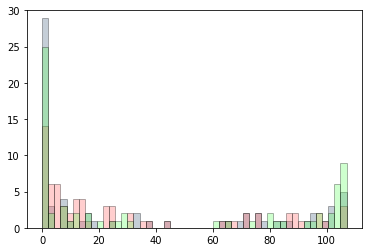

In [33]:
plt.hist(df['GGN'].values, color="#3F5D7D", bins=50, edgecolor='black', alpha=.3);
plt.hist(df['PSN'].values, color="#FF5D5D", bins=50, edgecolor='black', alpha=.3);
plt.hist(df['Solid'].values, color="#5DFF5D", bins=50, edgecolor='black', alpha=.3);
plt.ylim([0, 30])

In [34]:
sum_GGN = np.sum(df['GGN'].values > 85.6) # 85.6 ~ 80% of 107
sum_PSN = np.sum(df['PSN'].values > 85.6)
sum_Solid = np.sum(df['Solid'].values > 85.6)
print(f'{sum_GGN} + {sum_PSN} + {sum_Solid} = {sum_GGN+ sum_PSN + sum_Solid}')

13 + 11 + 21 = 45


### Check consensus with entropy

In [35]:
from scipy.stats import entropy

In [36]:
def get_entropy(x):
    return entropy(x)

In [37]:
df['entr_ndl'] = df[['GGN','PSN','Solid']].apply(get_entropy, axis=1).values
df['entr_initial'] = df[['initial_mgmt_discharge','initial_mgmt_follow_up']].apply(get_entropy, axis=1).values
df['entr_strategy'] = df[['strategy_discharge','strategy_CT','strategy_invasive','strategy_hybrid']].apply(get_entropy, axis=1).values

In [38]:
df.head()

,NoduleNo,GGN,PSN,Solid,initial_mgmt_discharge,initial_mgmt_follow_up,strategy_discharge,strategy_CT,strategy_invasive,strategy_hybrid,PET-CT_No,PET-CT_Yes,entr_ndl,entr_initial,entr_strategy
0,1,87.0,12.0,8.0,79.0,28,79.0,28,0.0,0.0,28,0.0,0.607517,0.574809,0.574809
1,2,83.0,16.0,8.0,30.0,77,30.0,77,0.0,0.0,76,1.0,0.675065,0.593306,0.593306
2,3,1.0,5.0,101.0,1.0,106,1.0,103,2.0,1.0,89,17.0,0.241293,0.052973,0.198405
3,4,0.0,9.0,98.0,0.0,107,0.0,88,17.0,2.0,75,32.0,0.288700,0.000000,0.527440
4,5,33.0,71.0,3.0,0.0,107,0.0,74,32.0,1.0,62,45.0,0.735157,0.000000,0.659704


In [39]:
cols = df.columns.tolist()
cols = [cols[0]] + [cols[-3]] + cols[1:4] + [cols[-2]] + cols[4:6] + [cols[-1]] + cols[6:-3]
df = df[cols]
df.head()

,NoduleNo,entr_ndl,GGN,PSN,Solid,entr_initial,initial_mgmt_discharge,initial_mgmt_follow_up,entr_strategy,strategy_discharge,strategy_CT,strategy_invasive,strategy_hybrid,PET-CT_No,PET-CT_Yes
0,1,0.607517,87.0,12.0,8.0,0.574809,79.0,28,0.574809,79.0,28,0.0,0.0,28,0.0
1,2,0.675065,83.0,16.0,8.0,0.593306,30.0,77,0.593306,30.0,77,0.0,0.0,76,1.0
2,3,0.241293,1.0,5.0,101.0,0.052973,1.0,106,0.198405,1.0,103,2.0,1.0,89,17.0
3,4,0.288700,0.0,9.0,98.0,0.000000,0.0,107,0.527440,0.0,88,17.0,2.0,75,32.0
4,5,0.735157,33.0,71.0,3.0,0.000000,0.0,107,0.659704,0.0,74,32.0,1.0,62,45.0


In [40]:
print(len(df.loc[df.entr_ndl<.1]))
df.loc[df.entr_ndl<.1]

15


,NoduleNo,entr_ndl,GGN,PSN,Solid,entr_initial,initial_mgmt_discharge,initial_mgmt_follow_up,entr_strategy,strategy_discharge,strategy_CT,strategy_invasive,strategy_hybrid,PET-CT_No,PET-CT_Yes
10,11,0.000000,107.0,0.0,0.0,0.467689,19.0,88,0.467689,19.0,88,0.0,0.0,88,0.0
20,21,0.000000,0.0,107.0,0.0,0.000000,0.0,107,0.685767,0.0,81,20.0,6.0,75,32.0
23,25,0.000000,0.0,107.0,0.0,0.000000,0.0,107,0.922781,0.0,51,47.0,9.0,41,66.0
27,29,0.092902,105.0,2.0,0.0,0.216028,6.0,101,0.216028,6.0,101,0.0,0.0,100,1.0
32,34,0.092902,105.0,2.0,0.0,0.453059,18.0,89,0.504302,18.0,88,1.0,0.0,87,2.0
37,39,0.052973,0.0,1.0,106.0,0.159537,4.0,103,0.338643,4.0,99,3.0,1.0,81,22.0
39,41,0.000000,107.0,0.0,0.0,0.127852,3.0,104,0.127852,3.0,104,0.0,0.0,102,2.0
41,43,0.092902,0.0,2.0,105.0,0.127852,3.0,104,0.180559,3.0,103,1.0,0.0,96,8.0
50,52,0.092902,0.0,2.0,105.0,0.692055,51.0,56,0.692055,51.0,56,0.0,0.0,55,1.0
51,53,0.052973,0.0,1.0,106.0,0.265797,8.0,99,0.318041,8.0,98,1.0,0.0,93,6.0


In [41]:
print(len(df.loc[df.entr_ndl<.2]))
df.loc[df.entr_ndl<.2]

25


,NoduleNo,entr_ndl,GGN,PSN,Solid,entr_initial,initial_mgmt_discharge,initial_mgmt_follow_up,entr_strategy,strategy_discharge,strategy_CT,strategy_invasive,strategy_hybrid,PET-CT_No,PET-CT_Yes
10,11,0.000000,107.0,0.0,0.0,0.467689,19.0,88,0.467689,19.0,88,0.0,0.0,88,0.0
12,13,0.188769,102.0,5.0,0.0,0.052973,1.0,106,0.264676,1.0,101,4.0,1.0,99,7.0
20,21,0.000000,0.0,107.0,0.0,0.000000,0.0,107,0.685767,0.0,81,20.0,6.0,75,32.0
23,25,0.000000,0.0,107.0,0.0,0.000000,0.0,107,0.922781,0.0,51,47.0,9.0,41,66.0
27,29,0.092902,105.0,2.0,0.0,0.216028,6.0,101,0.216028,6.0,101,0.0,0.0,100,1.0
32,34,0.092902,105.0,2.0,0.0,0.453059,18.0,89,0.504302,18.0,88,1.0,0.0,87,2.0
34,36,0.105858,1.0,105.0,1.0,0.000000,0.0,107,0.798073,0.0,31,70.0,6.0,22,85.0
35,37,0.159537,0.0,4.0,103.0,0.092902,2.0,105,0.346709,2.0,99,3.0,3.0,80,25.0
36,38,0.127852,0.0,3.0,104.0,0.000000,0.0,107,0.383155,0.0,95,11.0,1.0,63,44.0
37,39,0.052973,0.0,1.0,106.0,0.159537,4.0,103,0.338643,4.0,99,3.0,1.0,81,22.0


In [42]:
print(len(df.loc[df.entr_ndl<.3]))
df.loc[df.entr_ndl<.3]

31


,NoduleNo,entr_ndl,GGN,PSN,Solid,entr_initial,initial_mgmt_discharge,initial_mgmt_follow_up,entr_strategy,strategy_discharge,strategy_CT,strategy_invasive,strategy_hybrid,PET-CT_No,PET-CT_Yes
2,3,0.241293,1.0,5.0,101.0,0.052973,1.0,106,0.198405,1.0,103,2.0,1.0,89,17.0
3,4,0.288700,0.0,9.0,98.0,0.000000,0.0,107,0.527440,0.0,88,17.0,2.0,75,32.0
10,11,0.000000,107.0,0.0,0.0,0.467689,19.0,88,0.467689,19.0,88,0.0,0.0,88,0.0
11,12,0.268459,100.0,6.0,1.0,0.331200,11.0,96,0.383155,11.0,95,1.0,0.0,96,0.0
12,13,0.188769,102.0,5.0,0.0,0.052973,1.0,106,0.264676,1.0,101,4.0,1.0,99,7.0
20,21,0.000000,0.0,107.0,0.0,0.000000,0.0,107,0.685767,0.0,81,20.0,6.0,75,32.0
21,22,0.216028,101.0,6.0,0.0,0.188769,5.0,102,0.188769,5.0,102,0.0,0.0,101,1.0
22,24,0.265797,0.0,99.0,8.0,0.000000,0.0,107,0.842406,0.0,23,72.0,12.0,24,83.0
23,25,0.000000,0.0,107.0,0.0,0.000000,0.0,107,0.922781,0.0,51,47.0,9.0,41,66.0
27,29,0.092902,105.0,2.0,0.0,0.216028,6.0,101,0.216028,6.0,101,0.0,0.0,100,1.0


In [43]:
print(len(df.loc[df.entr_ndl>.8]))
df.loc[df.entr_ndl>.7]

6


,NoduleNo,entr_ndl,GGN,PSN,Solid,entr_initial,initial_mgmt_discharge,initial_mgmt_follow_up,entr_strategy,strategy_discharge,strategy_CT,strategy_invasive,strategy_hybrid,PET-CT_No,PET-CT_Yes
4,5,0.735157,33.0,71.0,3.0,0.000000,0.0,107,0.659704,0.0,74,32.0,1.0,62,45.0
5,6,0.807006,10.0,23.0,74.0,0.644804,37.0,70,0.644804,37.0,70,0.0,0.0,70,0.0
6,7,0.921889,16.0,25.0,66.0,0.632108,35.0,72,0.632108,35.0,72,0.0,0.0,72,0.0
7,8,0.756657,7.0,76.0,24.0,0.387983,14.0,93,0.529689,14.0,90,2.0,1.0,91,2.0
14,15,0.953275,33.0,14.0,60.0,0.693104,54.0,53,0.693104,54.0,53,0.0,0.0,53,0.0
17,18,0.896695,13.0,67.0,27.0,0.660964,40.0,67,0.660964,40.0,67,0.0,0.0,66,1.0
25,27,0.795791,72.0,7.0,28.0,0.564887,80.0,27,0.564887,80.0,27,0.0,0.0,27,0.0
28,30,0.721903,63.0,43.0,1.0,0.632108,35.0,72,0.681357,35.0,71,1.0,0.0,71,1.0
29,31,0.904698,65.0,12.0,30.0,0.610070,75.0,32,0.610070,75.0,32,0.0,0.0,32,0.0
38,40,0.750139,79.0,11.0,17.0,0.288700,9.0,98,0.288700,9.0,98,0.0,0.0,97,1.0
